In [1]:
from distutils.dir_util import copy_tree
copy_tree("../input/ring-zoobot/", "./input")

['./input/zoobot/CODE_OF_CONDUCT.md',
 './input/zoobot/tests/pytorch/test_train_with_pytorch_lightning.py',
 './input/zoobot/tests/pytorch/test_define_model.py',
 './input/zoobot/tests/pytorch/test_finetune_classifier.py',
 './input/zoobot/tests/test_from_hub.py',
 './input/zoobot/tests/test_loss_equivalence.py',
 './input/zoobot/Dockerfile',
 './input/zoobot/common_install_issues.md',
 './input/zoobot/LICENSE',
 './input/zoobot/.gitignore',
 './input/zoobot/benchmarks/pytorch/run_dataset_benchmark.sh',
 './input/zoobot/benchmarks/pytorch/run_benchmarks.sh',
 './input/zoobot/benchmarks/pytorch/train_model_on_benchmark_dataset.py',
 './input/zoobot/benchmarks/tensorflow/run_dataset_benchmark.sh',
 './input/zoobot/benchmarks/tensorflow/deprecated/single_task_version_not_recommended/train_single_task_model.py',
 './input/zoobot/benchmarks/tensorflow/run_benchmarks.sh',
 './input/zoobot/benchmarks/tensorflow/train_model_on_benchmark_dataset.py',
 './input/zoobot/benchmarks/comparison_debug

In [2]:
pip install /kaggle/working/input/zoobot  "zoobot[pytorch-cu121]" --extra-index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu121
Processing ./input/zoobot
  Installing build dependencies ... - \ | / - \ | / - done
  Getting requirements to build wheel ... - done
  Preparing metadata (pyproject.toml) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 GB 341.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 84.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 788.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.4/512.4 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 745.2/745.2 kB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.4/70.4 kB 4.4 MB/s eta 0:00

In [3]:
import pandas as pd
import numpy as np
import logging
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import torch
from sklearn.metrics import log_loss
import torch.nn.functional as F

import matplotlib.pyplot as plt
from PIL import Image

def show_rings(df):
  # little utility function to visualise galaxies on test

    fig, axes = plt.subplots(ncols=5, figsize=(16, 3))
    for n in range(5):
        galaxy = df.iloc[n]

        im = Image.open(galaxy['file_loc'])
        axes[n].imshow(im)

        correct = np.around(galaxy['ring_pred']) == galaxy['ring']
        if correct:
            color = 'g'
        else:
            color = 'r'
        axes[n].text(20, 50, 'Pred: {:.2f}'.format(galaxy['ring_pred']), color=color)
        axes[n].text(20, 90, 'Label: {}'.format(galaxy['ring']), color=color)

        axes[n].axis('off')

def show_rings_2(df):
  # little utility function to visualise galaxies on catalog

    fig, axes = plt.subplots(ncols=5,nrows = 5, figsize=(16, 16))
    for i in range(5):
        for j in range(5):
            galaxy = df.iloc[i*5+j]
            
            im = Image.open(galaxy['file_loc'])
            axes[i,j].imshow(im)
            
            axes[i,j].text(20, 50, 'Pred: {:.2f}'.format(galaxy['ring_pred']), color='g')
            axes[i,j].set_title(galaxy['iauname'])
            axes[i,j].axis('off')
                     

pd.options.display.max_columns = None
pd.options.mode.chained_assignment = None

In [4]:
from galaxy_datasets.pytorch.galaxy_datamodule import GalaxyDataModule
from zoobot.pytorch.training.finetune import FinetuneableZoobotClassifier, get_trainer
from zoobot.pytorch.predictions import predict_on_catalog
from galaxy_datasets import gz_decals_5  # or gz_hubble, gz_candels, ...

logging.basicConfig(level=logging.INFO)


GZDESI/GZRings/GZCD not available from galaxy_datasets.pytorch.datasets - skipping


In [5]:
from kaggle_secrets import UserSecretsClient
from lightning.pytorch.loggers import WandbLogger
import wandb
user_secrets = UserSecretsClient()
my_secret = user_secrets.get_secret("wandb_api_key") 
wandb.login(key=my_secret)


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [6]:
gzd5_catalog_train, _ = gz_decals_5(
    root='../input/gzd5-data/gzd5',
    train=True,
    download=False
)

gzd5_catalog_test, _ = gz_decals_5(
    root='../input/gzd5-data/gzd5',
    train=False,
    download=False
)

gzd5_catalog = pd.concat([gzd5_catalog_train,gzd5_catalog_test])
gzd5_catalog = gzd5_catalog[['iauname','file_loc']].reset_index(drop=True).reset_index(names=['id_str'])
#----

gzd5_catalog_train = pd.read_csv('../input/ring-train-test/gzd5_catalog_train.csv')
gzd5_catalog_test = pd.read_csv('../input/ring-train-test/gzd5_catalog_test.csv')
gzd5_catalog_val = pd.read_csv('../input/ring-train-test/gzd5_catalog_val.csv')

gzd5_catalog_train.file_loc = '../input/gzd5-data/' + gzd5_catalog_train.file_loc.str.split('/',n=1).str[1]
gzd5_catalog_test.file_loc = '../input/gzd5-data/' + gzd5_catalog_test.file_loc.str.split('/',n=1).str[1]
gzd5_catalog_val.file_loc = '../input/gzd5-data/' + gzd5_catalog_val.file_loc.str.split('/',n=1).str[1]


label_cols = ['ring']
zoobot_dir = 'zoobot'



In [7]:
def train_ring(model_name, n_blocks, 
              gzd5_catalog_train, gzd5_catalog_test, gzd5_catalog = None, max_epochs = 50 ):
    
    save_dir = 'results/' + "gzd5-" + model_name + '-' + str(n_blocks)
    wandb.finish()
    wandb_logger = WandbLogger(project = 'rings-05-26-cosine',name ="gzd5-" + model_name  + '-' + str(n_blocks))
    full_model_name = 'hf_hub:mwalmsley/zoobot-encoder-' + model_name
    
    batch_size = 64 if model_name!='convnext_base' else 32
    
    datamodule = GalaxyDataModule(
      label_cols=label_cols,
      train_catalog = gzd5_catalog_train,
      val_catalog = gzd5_catalog_val,
      batch_size=batch_size,
      greyscale = False,
      resize_after_crop=224
    )


    model = FinetuneableZoobotClassifier(
          name = full_model_name, 
          num_classes=2,
          n_blocks=n_blocks,  
          lr_decay=0.1,
          learning_rate=0.0223, # due to bag i here we need to put a sqr root of lr 0.0001
          visualize_images = True,
          cosine_schedule = True,
          max_cosine_epochs = 10,
          max_learning_rate_reduction_factor = 0.5,
          dropout_prob = 0.7,
          label_smoothing = 0.1
        )

    trainer = get_trainer(save_dir,
                          accelerator='auto', 
                          devices=1, 
                          max_epochs=max_epochs,
                          logger = wandb_logger,
                          log_every_n_steps = 5,
                          patience = 5)
    print('Prepared fo training')
    trainer.fit(model, datamodule)
    print('Trained')
    best_checkpoint = trainer.checkpoint_callback.best_model_path
    finetuned_model = FinetuneableZoobotClassifier.load_from_checkpoint(best_checkpoint)

    _ = predict_on_catalog.predict(
          gzd5_catalog_test,
          finetuned_model,
          n_samples=1,
          label_cols=['not_ring', 'ring'],
          save_loc=os.path.join(save_dir, 'finetuned_predictions_test.csv'),
          datamodule_kwargs={'num_workers': 2, 'batch_size': batch_size, 'greyscale': False},  # we also need to set batch size here, or you may run out of memory
          trainer_kwargs={'accelerator': 'gpu'} 
        )

    predictions_test = pd.read_csv(os.path.join(save_dir, 'finetuned_predictions_test.csv'))
    predictions_test = pd.merge(predictions_test, gzd5_catalog_test[['id_str', 'file_loc', 'ring']])

    roc_auc_value = roc_auc_score(predictions_test.ring, predictions_test.ring_pred)
    log_loss_value = F.cross_entropy(
        torch.tensor(np.column_stack((predictions_test.not_ring_pred.values,predictions_test.ring_pred.values)),dtype=torch.float64,),
        torch.tensor(predictions_test.ring.values),  
        weight=torch.tensor([1,10],dtype=torch.float64), reduction='none').mean().item()
#     log_loss_value = log_loss(predictions_test.ring, predictions_test.ring_pred, sample_weight = np.where(predictions_test.ring == 1, 10, 1 ))
    pred_labels =  (predictions_test.ring_pred > 0.5)
    acc_value = (pred_labels == predictions_test.ring).sum() / predictions_test.shape[0]
    
    wandb.log({"test/roc_auc": roc_auc_value})
    wandb.log({"test/loss": log_loss_value})
    wandb.log({"test/acc": acc_value})
    
    print('roc_auc: ',roc_auc_value)
    print('log_loss: ',log_loss_value)
    print('acc: ',acc_value)

    top_5_predictions_test = predictions_test.sort_values('ring_pred', ascending=False)
    show_rings(top_5_predictions_test)
    bottom_5_predictions_test = predictions_test.sort_values('ring_pred', ascending=True)
    show_rings(bottom_5_predictions_test)
    random_predictions_test = predictions_test.sample(5)
    show_rings(random_predictions_test)
    print('Finished')

config.json:   0%|          | 0.00/659 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/59.9M [00:00<?, ?B/s]

INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
wandb: Currently logged in as: avshan (mlds-avshan). Use `wandb login --relogin` to force relogin


Prepared fo training


wandb: wandb version 0.16.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.5
wandb: Run data is saved locally in ./wandb/run-20240426_111145-qzke8qgp
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run gzd5-convnext_nano-0
wandb: ⭐️ View project at https://wandb.ai/mlds-avshan/rings-05-26-cosine
wandb: 🚀 View run at https://wandb.ai/mlds-avshan/rings-05-26-cosine/runs/qzke8qgp/workspace


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 447: 'finetuning/val_loss' reached 1.01625 (best 1.01625), saving model to '/kaggle/working/results/gzd5-convnext_nano-0/checkpoints/0.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 894: 'finetuning/val_loss' reached 1.01037 (best 1.01037), saving model to '/kaggle/working/results/gzd5-convnext_nano-0/checkpoints/1.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 1341: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 1788: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 2235: 'finetuning/val_loss' reached 1.00904 (best 1.00904), saving model to '/kaggle/working/results/gzd5-convnext_nano-0/checkpoints/4.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 2682: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 3129: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 3576: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 4023: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 4470: 'finetuning/val_loss' was not in top 1


Trained


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
2024-04-26 11:58:17.566557: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 11:58:17.566703: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 11:58:17.746126: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLA

Predicting: |          | 0/? [00:00<?, ?it/s]

roc_auc:  0.9873845088111335
log_loss:  0.8940208388359239
acc:  0.8549525431978584
Finished


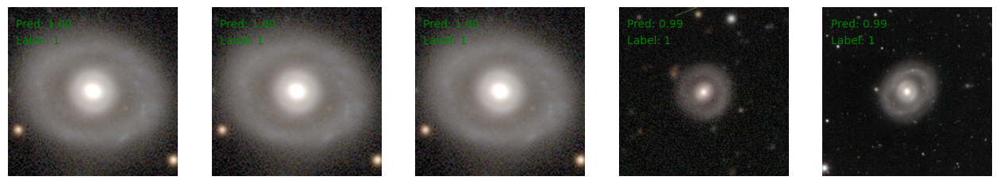

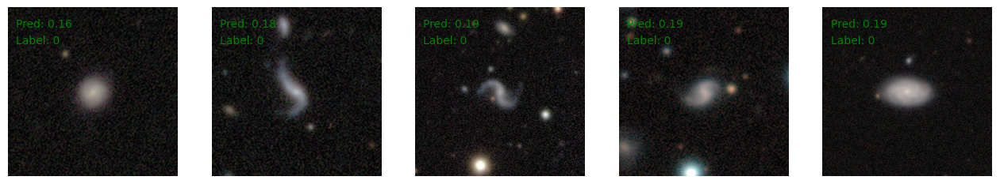

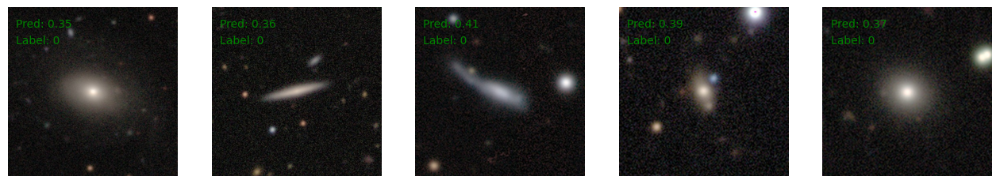

In [8]:
train_ring('convnext_nano',0, gzd5_catalog_train, gzd5_catalog_test)

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                 epoch ▁▁▂▂▃▃▃▃▄▄▅▅▆▆▆▆▇▇██
wandb:  finetuning/train_acc ▁▇█▇▇▇████
wandb: finetuning/train_loss █▂▁▂▁▁▁▁▁▁
wandb:    finetuning/val_acc ▁▆▃▇▇█▆▆▅▆
wandb:   finetuning/val_loss ▇▂█▂▁▂▂▁▂▃
wandb:              lr-AdamW ██▇▆▅▄▃▂▁▁
wandb:              test/acc ▁
wandb:             test/loss ▁
wandb:          test/roc_auc ▁
wandb:   trainer/global_step ▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇████
wandb: 
wandb: Run summary:
wandb:                 epoch 9
wandb:  finetuning/train_acc 0.79478
wandb: finetuning/train_loss 1.05176
wandb:    finetuning/val_acc 0.85354
wandb:   finetuning/val_loss 1.01148
wandb:              lr-AdamW 0.00025
wandb:              test/acc 0.85495
wandb:             test/loss 0.89402
wandb:          test/roc_auc 0.98738
wandb:   trainer/global_step 4469
wandb: 
wandb: 🚀 View run gzd5-convnext_nano-0 at: https://wandb.ai/mlds-avshan/rin

Prepared fo training


wandb: wandb version 0.16.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.5
wandb: Run data is saved locally in ./wandb/run-20240426_115926-5sq0ldl1
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run gzd5-convnext_nano-1
wandb: ⭐️ View project at https://wandb.ai/mlds-avshan/rings-05-26-cosine
wandb: 🚀 View run at https://wandb.ai/mlds-avshan/rings-05-26-cosine/runs/5sq0ldl1/workspace


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 447: 'finetuning/val_loss' reached 0.99230 (best 0.99230), saving model to '/kaggle/working/results/gzd5-convnext_nano-1/checkpoints/0.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 894: 'finetuning/val_loss' reached 0.98650 (best 0.98650), saving model to '/kaggle/working/results/gzd5-convnext_nano-1/checkpoints/1.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 1341: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 1788: 'finetuning/val_loss' reached 0.98004 (best 0.98004), saving model to '/kaggle/working/results/gzd5-convnext_nano-1/checkpoints/3.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 2235: 'finetuning/val_loss' reached 0.96971 (best 0.96971), saving model to '/kaggle/working/results/gzd5-convnext_nano-1/checkpoints/4.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 2682: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 3129: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 3576: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 4023: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 4470: 'finetuning/val_loss' was not in top 1


Trained


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

roc_auc:  0.9890375762632021
log_loss:  0.842707921549698
acc:  0.9480408858603067
Finished


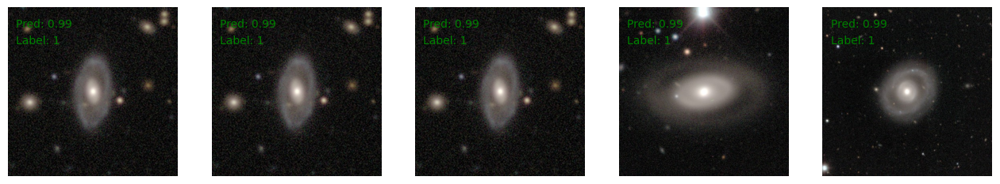

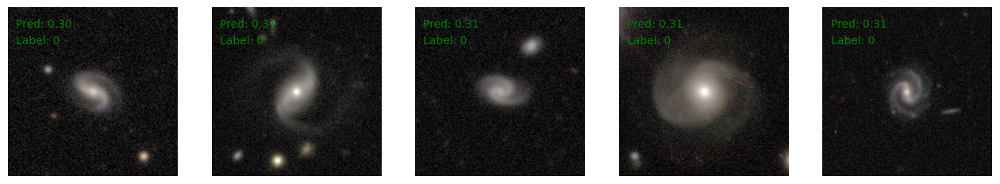

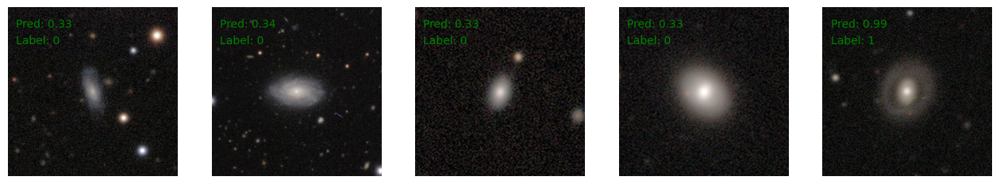

In [9]:
train_ring('convnext_nano',1, gzd5_catalog_train, gzd5_catalog_test)

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                 epoch ▁▁▂▂▃▃▃▃▄▄▅▅▆▆▆▆▇▇██
wandb:  finetuning/train_acc ▁▅▆▆▆▇▇███
wandb: finetuning/train_loss █▅▄▄▃▂▂▁▁▁
wandb:    finetuning/val_acc ▁▁▆▁▅▅▇█▇█
wandb:   finetuning/val_loss ▆▄▆▃▁▄█▂▂▆
wandb:          lr-AdamW/pg1 ██▇▆▅▄▃▂▁▁
wandb:          lr-AdamW/pg2 ██▇▆▅▄▃▂▁▁
wandb:              test/acc ▁
wandb:             test/loss ▁
wandb:          test/roc_auc ▁
wandb:   trainer/global_step ▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇████
wandb: 
wandb: Run summary:
wandb:                 epoch 9
wandb:  finetuning/train_acc 0.9734
wandb: finetuning/train_loss 0.93423
wandb:    finetuning/val_acc 0.96789
wandb:   finetuning/val_loss 0.99425
wandb:          lr-AdamW/pg1 0.00025
wandb:          lr-AdamW/pg2 0.00025
wandb:              test/acc 0.94804
wandb:             test/loss 0.84271
wandb:          test/roc_auc 0.98904
wandb:   trainer/global_step 4469
wandb: 

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/198M [00:00<?, ?B/s]

INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Prepared fo training


wandb: wandb version 0.16.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.5
wandb: Run data is saved locally in ./wandb/run-20240426_124702-xzx98l3o
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run gzd5-convnext_small-0
wandb: ⭐️ View project at https://wandb.ai/mlds-avshan/rings-05-26-cosine
wandb: 🚀 View run at https://wandb.ai/mlds-avshan/rings-05-26-cosine/runs/xzx98l3o/workspace


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 447: 'finetuning/val_loss' reached 1.01393 (best 1.01393), saving model to '/kaggle/working/results/gzd5-convnext_small-0/checkpoints/0.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 894: 'finetuning/val_loss' reached 1.00878 (best 1.00878), saving model to '/kaggle/working/results/gzd5-convnext_small-0/checkpoints/1.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 1341: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 1788: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 2235: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 2682: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 3129: 'finetuning/val_loss' was not in top 1


Trained


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

roc_auc:  0.9870759529439759
log_loss:  0.8866415382980736
acc:  0.8435142370406425
Finished


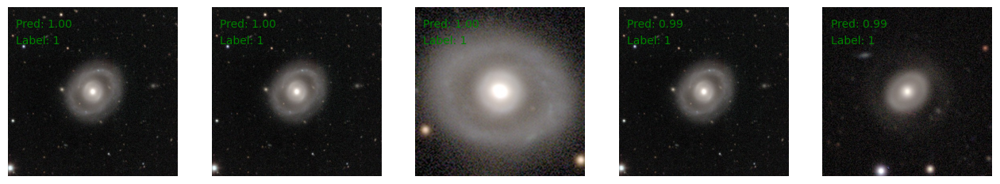

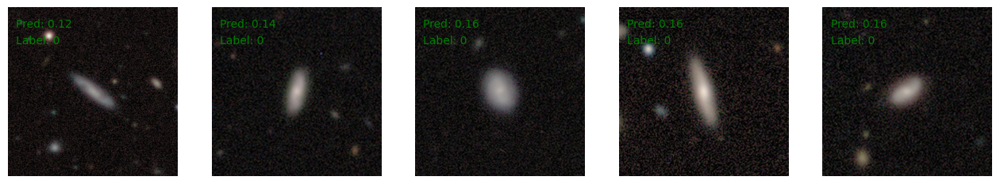

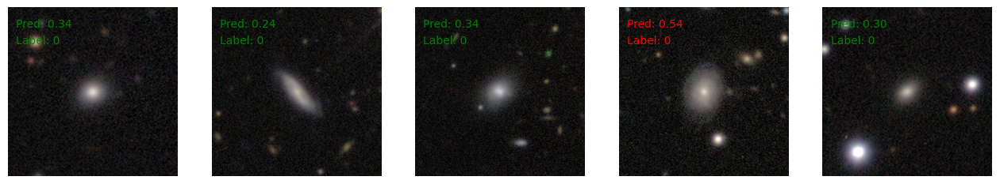

In [10]:
train_ring('convnext_small',0, gzd5_catalog_train, gzd5_catalog_test)

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                 epoch ▁▁▂▂▃▃▅▅▆▆▇▇██
wandb:  finetuning/train_acc ▁▇▇████
wandb: finetuning/train_loss █▁▂▂▁▁▂
wandb:    finetuning/val_acc ▅█▁▆▆▆▆
wandb:   finetuning/val_loss █▁▆▃▂▅▁
wandb:              lr-AdamW ██▇▆▄▃▁
wandb:              test/acc ▁
wandb:             test/loss ▁
wandb:          test/roc_auc ▁
wandb:   trainer/global_step ▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇█████
wandb: 
wandb: Run summary:
wandb:                 epoch 6
wandb:  finetuning/train_acc 0.79086
wandb: finetuning/train_loss 1.05313
wandb:    finetuning/val_acc 0.84613
wandb:   finetuning/val_loss 1.00882
wandb:              lr-AdamW 0.00031
wandb:              test/acc 0.84351
wandb:             test/loss 0.88664
wandb:          test/roc_auc 0.98708
wandb:   trainer/global_step 3128
wandb: 
wandb: 🚀 View run gzd5-convnext_small-0 at: https://wandb.ai/mlds-avshan/rings-05-26-cosine/runs/xzx98l3o

Prepared fo training


wandb: wandb version 0.16.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.5
wandb: Run data is saved locally in ./wandb/run-20240426_141659-hg29y3yg
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run gzd5-convnext_small-1
wandb: ⭐️ View project at https://wandb.ai/mlds-avshan/rings-05-26-cosine
wandb: 🚀 View run at https://wandb.ai/mlds-avshan/rings-05-26-cosine/runs/hg29y3yg/workspace


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 447: 'finetuning/val_loss' reached 0.97844 (best 0.97844), saving model to '/kaggle/working/results/gzd5-convnext_small-1/checkpoints/0.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 894: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 1341: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 1788: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 2235: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 2682: 'finetuning/val_loss' was not in top 1


Trained


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

roc_auc:  0.9896843430474677
log_loss:  0.8462304513578999
acc:  0.9615478218544659
Finished


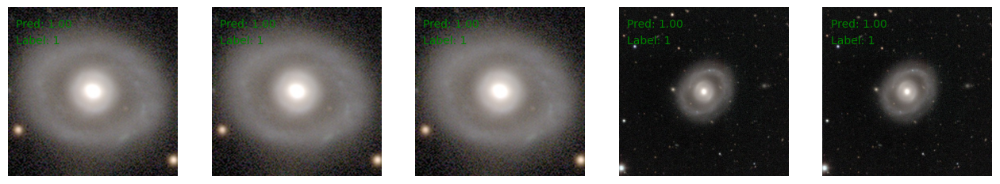

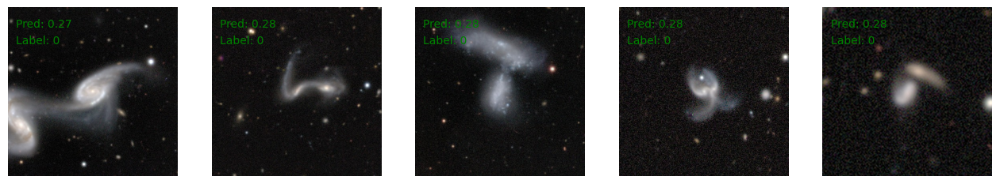

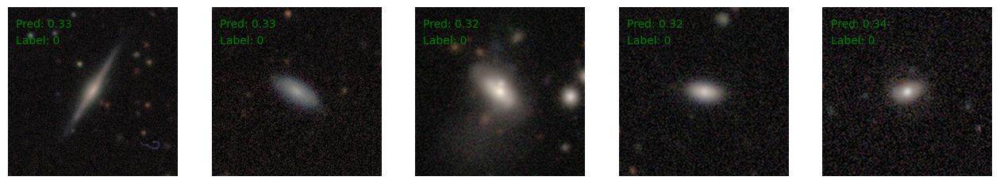

In [11]:
train_ring('convnext_small',1, gzd5_catalog_train, gzd5_catalog_test)

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                 epoch ▁▁▂▂▄▄▅▅▇▇██
wandb:  finetuning/train_acc ▁▆▇▇▇█
wandb: finetuning/train_loss █▄▃▃▂▁
wandb:    finetuning/val_acc ▄▅▁▅▅█
wandb:   finetuning/val_loss ▁▄▁▅▁█
wandb:          lr-AdamW/pg1 ██▇▅▃▁
wandb:          lr-AdamW/pg2 ██▇▅▃▁
wandb:              test/acc ▁
wandb:             test/loss ▁
wandb:          test/roc_auc ▁
wandb:   trainer/global_step ▁▁▂▂▂▂▃▃▃▃▄▄▅▅▆▆▆▆▇▇▇▇█████
wandb: 
wandb: Run summary:
wandb:                 epoch 5
wandb:  finetuning/train_acc 0.97267
wandb: finetuning/train_loss 0.94159
wandb:    finetuning/val_acc 0.96913
wandb:   finetuning/val_loss 0.99392
wandb:          lr-AdamW/pg1 0.00035
wandb:          lr-AdamW/pg2 0.00035
wandb:              test/acc 0.96155
wandb:             test/loss 0.84623
wandb:          test/roc_auc 0.98968
wandb:   trainer/global_step 2681
wandb: 
wandb: 🚀 View run gzd5-convnext_small-1 at:

config.json:   0%|          | 0.00/664 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/350M [00:00<?, ?B/s]

INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Prepared fo training


wandb: wandb version 0.16.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.5
wandb: Run data is saved locally in ./wandb/run-20240426_153434-a84difrl
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run gzd5-convnext_base-0
wandb: ⭐️ View project at https://wandb.ai/mlds-avshan/rings-05-26-cosine
wandb: 🚀 View run at https://wandb.ai/mlds-avshan/rings-05-26-cosine/runs/a84difrl/workspace


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 894: 'finetuning/val_loss' reached 1.01156 (best 1.01156), saving model to '/kaggle/working/results/gzd5-convnext_base-0/checkpoints/0.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 1788: 'finetuning/val_loss' reached 1.00717 (best 1.00717), saving model to '/kaggle/working/results/gzd5-convnext_base-0/checkpoints/1.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 2682: 'finetuning/val_loss' was not in top 1
wandb: Network error (ReadTimeout), entering retry loop.


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 3576: 'finetuning/val_loss' reached 1.00590 (best 1.00590), saving model to '/kaggle/working/results/gzd5-convnext_base-0/checkpoints/3.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 4470: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 5364: 'finetuning/val_loss' reached 1.00284 (best 1.00284), saving model to '/kaggle/working/results/gzd5-convnext_base-0/checkpoints/5.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 6258: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 7152: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 8, global step 8046: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 9, global step 8940: 'finetuning/val_loss' was not in top 1
/opt/conda/lib/python3.10/site-packages/zoobot/pytorch/training/schedulers.py:42: RuntimeWarning: Current step number 11 exceeds max_steps 10.
  warnings.warn(


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 10, global step 9834: 'finetuning/val_loss' was not in top 1


Trained


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

roc_auc:  0.9889327532769726
log_loss:  0.8766890359275693
acc:  0.863592114869798
Finished


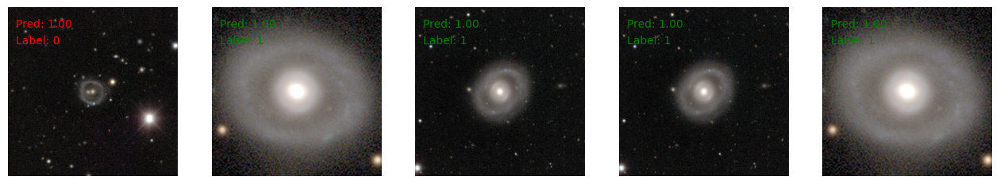

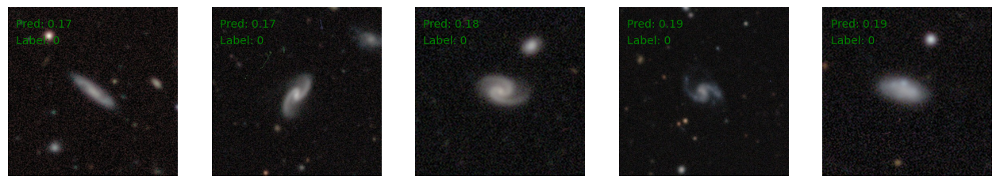

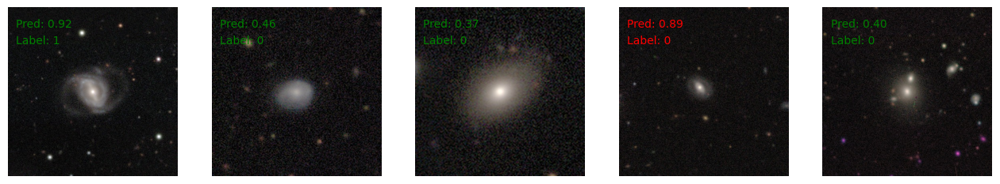

In [12]:
train_ring('convnext_base',0, gzd5_catalog_train, gzd5_catalog_test)

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                 epoch ▁▁▂▂▂▂▃▃▄▄▅▅▅▅▆▆▇▇▇▇██
wandb:  finetuning/train_acc ▁▆▆▇▆▇▇▇███
wandb: finetuning/train_loss █▃▂▂▂▂▁▂▁▁▁
wandb:    finetuning/val_acc ▁▄▄▆▆█▆▆▅▇▅
wandb:   finetuning/val_loss █▄▅▃▅▁▂▅▂▂▂
wandb:              lr-AdamW ██▇▆▅▄▃▂▁▁▁
wandb:              test/acc ▁
wandb:             test/loss ▁
wandb:          test/roc_auc ▁
wandb:   trainer/global_step ▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇████
wandb: 
wandb: Run summary:
wandb:                 epoch 10
wandb:  finetuning/train_acc 0.81121
wandb: finetuning/train_loss 1.03559
wandb:    finetuning/val_acc 0.85206
wandb:   finetuning/val_loss 1.00432
wandb:              lr-AdamW 0.00025
wandb:              test/acc 0.86359
wandb:             test/loss 0.87669
wandb:          test/roc_auc 0.98893
wandb:   trainer/global_step 9833
wandb: 
wandb: 🚀 View run gzd5-convnext_base-0 at: https://wandb.ai/mlds-av

Prepared fo training


wandb: wandb version 0.16.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.5
wandb: Run data is saved locally in ./wandb/run-20240426_192156-8vff0grs
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run gzd5-convnext_base-1
wandb: ⭐️ View project at https://wandb.ai/mlds-avshan/rings-05-26-cosine
wandb: 🚀 View run at https://wandb.ai/mlds-avshan/rings-05-26-cosine/runs/8vff0grs/workspace


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 894: 'finetuning/val_loss' reached 0.98374 (best 0.98374), saving model to '/kaggle/working/results/gzd5-convnext_base-1/checkpoints/0.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 1788: 'finetuning/val_loss' reached 0.97299 (best 0.97299), saving model to '/kaggle/working/results/gzd5-convnext_base-1/checkpoints/1.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 2682: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 3576: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 4470: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 5364: 'finetuning/val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 6258: 'finetuning/val_loss' was not in top 1


Trained


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

roc_auc:  0.9818365954784201
log_loss:  0.8496380664333385
acc:  0.9647116086639085
Finished


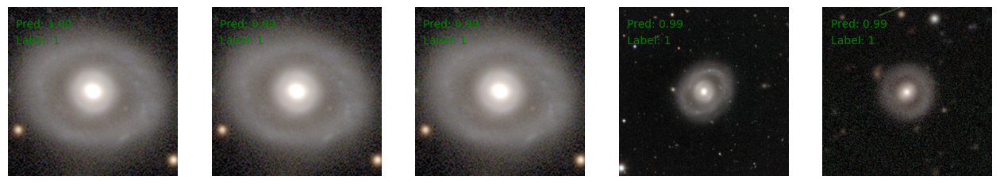

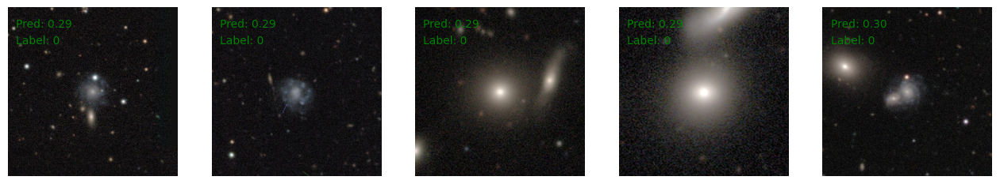

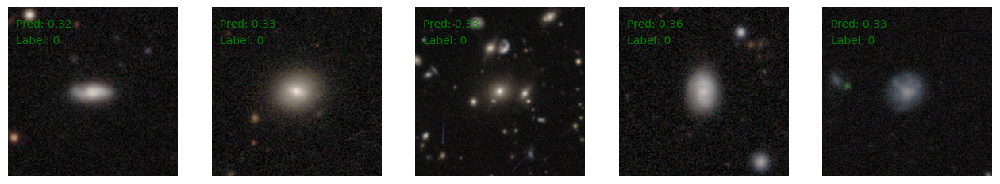

In [13]:
train_ring('convnext_base',1, gzd5_catalog_train, gzd5_catalog_test)